# Analisis población de la Ascensión

## Cargue Paquetes

In [98]:
import numpy                 as np
import pandas                as pd
import matplotlib.pyplot     as plt
import seaborn               as sns
import folium  #needed for interactive map
from folium.plugins import HeatMap
# Using plotly.express
import plotly.express as px
from dateutil.relativedelta import *
import datetime as dt

## Cargue de la Base de datos de Beneficiarios

In [99]:
df = pd.read_csv('C:/Users/JOSE CV/Downloads/La Ascensión S.A/MinTIC/Beneficiarios.csv',sep='\t',encoding='utf-16-le')
df

,#,DocEntry,Sexo,Numero de Documento,Parentesco,Fecha Nacimiento,Fecha Retiro,Fecha Siniestro,Fecha Crea Contrato,Unnamed: 9
0,1,1,F,31418546,HERM,24/10/1972,NaN,NaN,04/11/2008,NaN
1,2,1,F,22103662,TITU,20/10/1953,NaN,NaN,04/11/2008,NaN
2,3,1,M,96052118163,SOBR,21/05/1996,NaN,NaN,04/11/2008,NaN
3,4,1,M,98091958470,CUÑA,19/09/1990,NaN,NaN,04/11/2008,NaN
4,5,1,F,43462250,PRIM,28/01/1980,NaN,NaN,04/11/2008,NaN
...,...,...,...,...,...,...,...,...,...,...
2620556,2620557,473615,M,1006511032,SOBR,04/04/2003,NaN,NaN,23/03/2022,NaN
2620557,2620558,473615,M,86065242,HERM,09/07/1980,NaN,NaN,23/03/2022,NaN
2620558,2620559,473616,F,57465386,0,01/01/1986,NaN,NaN,23/03/2022,NaN
2620559,2620560,473616,F,57465386-0,MDRE,01/01/1957,NaN,NaN,23/03/2022,NaN


## Analisis de la Base de Datos de Beneficiarios

In [100]:
#df_serfun = pd.read_csv('C:/Users/JOSE CV/Downloads/La Ascensión S.A/MinTIC/SerFun.xls.csv',sep=';')
#df_serfun

# Modificando Fechas

In [101]:
import datetime as dt
#from datetime import datetime

In [102]:
df['Fecha Nacimiento']=pd.to_datetime(df['Fecha Nacimiento'], format='%d/%m/%Y', errors = 'coerce')
df['Fecha Retiro']=pd.to_datetime(df['Fecha Retiro'], format='%d/%m/%Y', errors = 'coerce')
df['Fecha Siniestro']=pd.to_datetime(df['Fecha Siniestro'], format='%d/%m/%Y', errors = 'coerce')
df['Fecha Crea Contrato']=pd.to_datetime(df['Fecha Crea Contrato'], format='%d/%m/%Y', errors = 'coerce')


In [103]:
df['FCC_year'] = df['Fecha Crea Contrato'].dt.year
df['FCC_month']=df['Fecha Crea Contrato'].dt.month

In [104]:
df['FN_year'] = df['Fecha Nacimiento'].dt.year
df['FN_month']=df['Fecha Nacimiento'].dt.month

In [105]:
df['FR_year'] = df['Fecha Retiro'].dt.year
df['FR_month']=df['Fecha Retiro'].dt.month
df['FR_day']=df['Fecha Retiro'].dt.day_name()

In [106]:
df['FS_year'] = df['Fecha Siniestro'].dt.year
df['FS_month']=df['Fecha Siniestro'].dt.month
df['FS_day']=df['Fecha Siniestro'].dt.day_name()

In [107]:
#df['FCC_y_m'] = df['Fecha Crea Contrato'].dt.to_period('M')
#df['FN_y_m']=df['Fecha Nacimiento'].dt.to_period('M')
#df['FR_y_m']=df['Fecha Retiro'].dt.to_period('M')
#df['FS_y_m']=df['Fecha Siniestro'].dt.to_period('M')

In [108]:
df['FCC_y_m'] = df['Fecha Crea Contrato'].dt.strftime('%Y-%m')
df['FN_y_m']=df['Fecha Nacimiento'].dt.strftime('%Y-%m')
df['FR_y_m']=df['Fecha Retiro'].dt.strftime('%Y-%m')
df['FS_y_m']=df['Fecha Siniestro'].dt.strftime('%Y-%m')

In [109]:
print(df['FCC_year'].min())
print(df['FN_year'].min())
print(df['FR_year'].min())
print(df['FS_year'].min())

2001.0
1899.0
1900.0
2001.0


### Creación de la Variable EDAD

#### EDAD

In [110]:
from datetime import date

def calculate_age(born):
    today = date.today()
    return today.year - born.year - ((today.month, today.day) < (born.month, born.day))

In [111]:
df['Age_Cal']=df['Fecha Nacimiento'].apply(lambda x: calculate_age(x))

In [112]:
from datetime import date

def calculate_age_fall(born,fallecimiento):
    today = date.today()
    return fallecimiento.year - born.year - ((fallecimiento.month, fallecimiento.day) < (born.month, born.day))

#### EDAD Calculada dependiendo si hubo siniestro o se retiro

In [113]:
df[df['Fecha Siniestro'].isnull()==False]['Age_Cal']=df[df['Fecha Siniestro'].isnull()==False][['Fecha Nacimiento','Fecha Siniestro']].apply(lambda x: calculate_age_fall(x['Fecha Nacimiento'],x['Fecha Siniestro']),axis=1)
df[df['Fecha Retiro'].isnull()==False]['Age_Cal']=df[df['Fecha Retiro'].isnull()==False][['Fecha Nacimiento','Fecha Retiro']].apply(lambda x: calculate_age_fall(x['Fecha Nacimiento'],x['Fecha Retiro']),axis=1)

C:\Users\JOSE CV\AppData\Local\Temp\ipykernel_36288\1521662118.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\JOSE CV\AppData\Local\Temp\ipykernel_36288\1521662118.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[Text(0.5, 0, 'Age'), Text(0, 0.5, 'Count')]

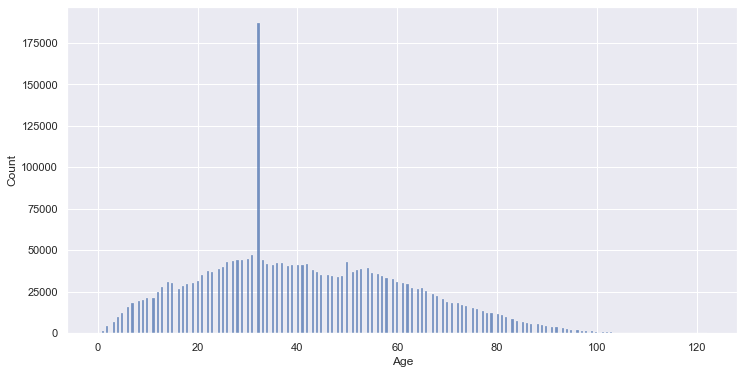

In [114]:
sns.set_theme()
plt.figure(figsize=(12, 6))
ax=sns.histplot(data=df,x='Age_Cal')
ax.set(xlabel='Age', ylabel='Count')

### Agregando Rangos de Edad

In [115]:
def rango_edad(edad):
    rango = ''
    if edad < 1:
        rango = "m1a"
    elif edad>=1 and edad<=4:
        rango = "1-4"
    elif edad >4 and edad <=14:
        rango = "5-14"
    elif edad>14 and edad<=44:
        rango = "15-44"
    elif edad>44 and edad<=64:
        rango = "45-64"
    elif edad>64 and edad<=84:
        rango = "65-84"
    elif edad>84 and edad<=99:
        rango = "85-99"
    elif edad>99:
        rango = "mas_100"
    else:
        rango = 'NA'
    return rango

In [116]:
df['Rango_Edad']=df['Age_Cal'].apply(rango_edad)

In [117]:
df['Rango_Edad'].unique()

array(['45-64', '65-84', '15-44', '5-14', '85-99', '1-4', 'mas_100',
       'm1a', 'NA'], dtype=object)

### Filtro por años de estudio

In [118]:
df=df[(df['FCC_year']>=2015)]#&(df['FR_year']>=2015)&(df['FS_year']>=2015)]
df.shape

(1456476, 26)

In [119]:
#Eliminando error de los Retirados y Siniestros con fecha 
df=df[((df['FR_year'].isnull()==True)|(df['FR_year']>=2015))&((df['FS_year'].isnull()==True)|(df['FS_year']>=2015))]

## Agrefando variable Ubicación

In [120]:
Contratos = pd.read_csv('C:/Users/JOSE CV/Downloads/La Ascensión S.A/MinTIC/Contratos.csv',sep=';')
Contratos

,Doc entry,Nombre UEN,Nombre Sub UEN,Convenio actual,Nombre Convenio,Fecha real contrato,Numero Contrato,Estado del Contrato,Tipo de Contrato,Codigo plan,Nombre Plan,Sucursal
0,265278,EMPRESARIAL,EMPRESARIAL,1621,MEMBRESIA VIP CLUB SAS,1/10/2018,MVIP1810068R,CANC,NUE,S2919,INSIGNIA - MEMBRESIA VIP CLUB SAS,Of. Principal
1,265279,EMPRESARIAL,EMPRESARIAL,1621,MEMBRESIA VIP CLUB SAS,1/10/2018,MVIP1810069R,CANC,NUE,S2919,INSIGNIA - MEMBRESIA VIP CLUB SAS,Of. Principal
2,265280,EMPRESARIAL,EMPRESARIAL,1621,MEMBRESIA VIP CLUB SAS,1/10/2018,MVIP1810070R,CANC,NUE,S2919,INSIGNIA - MEMBRESIA VIP CLUB SAS,Of. Principal
3,265281,EMPRESARIAL,EMPRESARIAL,1621,MEMBRESIA VIP CLUB SAS,1/10/2018,MVIP1810071R,CANC,NUE,S2919,INSIGNIA - MEMBRESIA VIP CLUB SAS,Of. Principal
4,265284,EMPRESARIAL,EMPRESARIAL,1621,MEMBRESIA VIP CLUB SAS,1/10/2018,MVIP1810073R,CANC,NUE,S2919,INSIGNIA - MEMBRESIA VIP CLUB SAS,Of. Principal
...,...,...,...,...,...,...,...,...,...,...,...,...
391295,166835,ORGANISMOS DEL ESTADO,ORGANISMOS DEL ESTADO,903,MUNICIPIO VILLA ROSARIO,1/12/2015,MUVI1512575R,CANC,NUE,S1324,2015-UNIPERSONAL MUNICIPIO VILLA ROSARIO,Cucuta
391296,166836,ORGANISMOS DEL ESTADO,ORGANISMOS DEL ESTADO,903,MUNICIPIO VILLA ROSARIO,1/12/2015,MUVI1512576R,CANC,NUE,S1324,2015-UNIPERSONAL MUNICIPIO VILLA ROSARIO,Cucuta
391297,166837,ORGANISMOS DEL ESTADO,ORGANISMOS DEL ESTADO,903,MUNICIPIO VILLA ROSARIO,1/12/2015,MUVI1512577R,CANC,NUE,S1324,2015-UNIPERSONAL MUNICIPIO VILLA ROSARIO,Cucuta
391298,166838,ORGANISMOS DEL ESTADO,ORGANISMOS DEL ESTADO,903,MUNICIPIO VILLA ROSARIO,1/12/2015,MUVI1512578R,CANC,NUE,S1324,2015-UNIPERSONAL MUNICIPIO VILLA ROSARIO,Cucuta


In [121]:
Contratos['Sucursal'] =  Contratos['Sucursal'].str.upper()

In [122]:
Contratos_Ubi=Contratos[['Doc entry','Sucursal']].copy()
Contratos_Ubi

,Doc entry,Sucursal
0,265278,OF. PRINCIPAL
1,265279,OF. PRINCIPAL
2,265280,OF. PRINCIPAL
3,265281,OF. PRINCIPAL
4,265284,OF. PRINCIPAL
...,...,...
391295,166835,CUCUTA
391296,166836,CUCUTA
391297,166837,CUCUTA
391298,166838,CUCUTA


In [123]:
df = df.merge(Contratos_Ubi, left_on='DocEntry', right_on='Doc entry')
df.head(2)

,#,DocEntry,Sexo,Numero de Documento,Parentesco,Fecha Nacimiento,Fecha Retiro,Fecha Siniestro,Fecha Crea Contrato,Unnamed: 9,...,FS_month,FS_day,FCC_y_m,FN_y_m,FR_y_m,FS_y_m,Age_Cal,Rango_Edad,Doc entry,Sucursal
0,84549,8746,M,93386567,0,1990-01-01,NaT,NaT,2019-09-24,NaN,...,NaN,NaN,2019-09,1990-01,NaN,NaN,32.0,15-44,8746,IBAGUE
1,84550,8746,M,933865671-3,PDRE,1945-06-04,NaT,NaT,2019-09-24,NaN,...,NaN,NaN,2019-09,1945-06,NaN,NaN,77.0,65-84,8746,IBAGUE


In [126]:
df["Sucursal_OLD"]=df["Sucursal"].copy()
deptos = {'MEDELLIN':"ANTIOQUIA", 'CARTAGENA':"BOLIVAR", 'BOGOTA':"BOGOTA D.C.", 'ARMENIA':"QUINDIO" ,
            'IBAGUE':"TOLIMA", 'CUCUTA':"NORTE DE SANTANDER",
       'CAJAMARCA':"TOLIMA", 'BUCARAMANGA':"SANTANDER", 'PASTO':"NARIÑO", 'BARRANQUILLA':"ATLANTICO",
       'SANTA MARTA':"MAGDALENA", 'NEIVA':"HUILA", 'SINCELEJO':"SUCRE", 'VILLAVICENCIO':"META",
       'CALI':"VALLE DEL CAUCA", 'SAN GIL':"SANTANDER" ,'FLORENCIA':"CAQUETA", 'OF. PRINCIPAL':"BOGOTA D.C.",
       'PEREIRA':"RISARALDA", 'VALLEDUPAR':"CESAR", 'MOCOA':"PUTUMAYO",'BUENAVENTURA':"VALLE DEL CAUCA",
        'POPAYAN':"CAUCA", 'MELGAR':"TOLIMA", 'VILLETA': "CUNDINAMARCA", 'TUNJA':"BOYACA", 'DUITAMA':"BOYACA",
       'MANIZALES':"CALDAS", 'YOPAL': "CASANARE", 'OUTSOURCING':"NO DISPONIBLE", 'CALI PAP':"VALLE DEL CAUCA",
       'VILLAVICENCIO PAP':"META", 'CALL CENTER':"NO DISPONIBLE", 'CALL CENTER - SAC':"NO DISPONIBLE"}
#df["DEPARTAMENTO"] = df["Sucursal"].replace(deptos)
df["Sucursal"].replace(deptos,inplace=True)

### Filtro Parentesco

Aplicando filtro por `Parentesco` esto debido a que para el analisis de la tasa de mortalidad no podemos unir personas y mascotas que es otro de los servicios de La Ascensión

In [127]:
df['Parentesco'].unique()

array(['0', 'PDRE', 'HJOA', 'OTRO', 'ESPO', 'HERM', 'MDRE', 'COMP',
       'CUÑA', 'TITU', 'TIO', 'PRIM', 'SOBR', 'SUEG', 'ABUE', 'NIET',
       'HJAS', 'PDAT', 'YERN', 'MDAT', 'NURA', 'HNOD', 'CONT', 'HJOD',
       'MASCO2', 'MASCO', 'NOCH', 'MASCO3', 'AMAYOR', 'PADRE'],
      dtype=object)

In [128]:
mascotas = ['MASCO','MASCO2','MASCO3']
mascotas

['MASCO', 'MASCO2', 'MASCO3']

In [129]:
personas = ['HERM', 'TITU', 'SOBR', 'CUÑA', 'PRIM', 'PDRE', 'ESPO', '0',
       'HJOA', 'ABUE', 'OTRO', 'MDRE', 'HJAS', 'SUEG', 'COMP', 'NIET',
       'TIO', 'NURA', 'MDAT', 'YERN', 'PDAT', 'CONT', 'HJOD', 'HNOD',
       'NOCH', 'PADRE', 'AMAYOR']

In [130]:
df_masc = df[df['Parentesco'].isin(mascotas)].copy()
df_masc

,#,DocEntry,Sexo,Numero de Documento,Parentesco,Fecha Nacimiento,Fecha Retiro,Fecha Siniestro,Fecha Crea Contrato,Unnamed: 9,...,FS_day,FCC_y_m,FN_y_m,FR_y_m,FS_y_m,Age_Cal,Rango_Edad,Doc entry,Sucursal,Sucursal_OLD
40486,1202243,142734,F,39780578-1,MASCO2,2013-09-10,NaT,NaT,2015-04-16,NaN,...,NaN,2015-04,2013-09,NaN,NaN,8.0,5-14,142734,BOGOTA D.C.,BOGOTA D.C.
40487,1202244,142734,F,39780578-8,MASCO,2014-06-20,NaT,NaT,2015-04-16,NaN,...,NaN,2015-04,2014-06,NaN,NaN,8.0,5-14,142734,BOGOTA D.C.,BOGOTA D.C.
47807,1209582,143713,M,39672414-1,MASCO2,2013-09-01,NaT,NaT,2015-04-29,NaN,...,NaN,2015-04,2013-09,NaN,NaN,8.0,5-14,143713,BOGOTA D.C.,BOGOTA D.C.
47809,1209584,143713,F,39672414-2,MASCO2,2014-10-01,NaT,NaT,2015-04-29,NaN,...,NaN,2015-04,2014-10,NaN,NaN,7.0,5-14,143713,BOGOTA D.C.,BOGOTA D.C.
47810,1209585,143714,F,20952552-1,MASCO,2013-01-01,NaT,NaT,2015-04-28,NaN,...,NaN,2015-04,2013-01,NaN,NaN,9.0,5-14,143714,BOGOTA D.C.,BOGOTA D.C.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455356,2619455,473446,F,93409813-2,MASCO2,2019-01-01,NaT,NaT,2022-03-18,NaN,...,NaN,2022-03,2019-01,NaN,NaN,3.0,1-4,473446,NO DISPONIBLE,NO DISPONIBLE
1455712,2619811,473504,F,1102367625-0,MASCO,2014-01-01,NaT,NaT,2022-03-18,NaN,...,NaN,2022-03,2014-01,NaN,NaN,8.0,5-14,473504,BOGOTA D.C.,BOGOTA D.C.
1455713,2619812,473504,F,1102367625-1,MASCO,2018-01-01,NaT,NaT,2022-03-18,NaN,...,NaN,2022-03,2018-01,NaN,NaN,4.0,1-4,473504,BOGOTA D.C.,BOGOTA D.C.
1455847,2619946,473522,F,4344254-2,MASCO,2020-01-01,NaT,NaT,2022-03-18,NaN,...,NaN,2022-03,2020-01,NaN,NaN,2.0,1-4,473522,RISARALDA,RISARALDA


In [131]:
df_benef = df[df['Parentesco'].isin(personas)].copy()
df_benef

,#,DocEntry,Sexo,Numero de Documento,Parentesco,Fecha Nacimiento,Fecha Retiro,Fecha Siniestro,Fecha Crea Contrato,Unnamed: 9,...,FS_day,FCC_y_m,FN_y_m,FR_y_m,FS_y_m,Age_Cal,Rango_Edad,Doc entry,Sucursal,Sucursal_OLD
0,84549,8746,M,93386567,0,1990-01-01,NaT,NaT,2019-09-24,NaN,...,NaN,2019-09,1990-01,NaN,NaN,32.0,15-44,8746,TOLIMA,TOLIMA
1,84550,8746,M,933865671-3,PDRE,1945-06-04,NaT,NaT,2019-09-24,NaN,...,NaN,2019-09,1945-06,NaN,NaN,77.0,65-84,8746,TOLIMA,TOLIMA
2,84551,8746,M,933865673-5,HJOA,2002-07-09,NaT,NaT,2019-09-24,NaN,...,NaN,2019-09,2002-07,NaN,NaN,19.0,15-44,8746,TOLIMA,TOLIMA
3,84552,8746,M,93386567-2,OTRO,1971-09-05,NaT,NaT,2019-09-24,NaN,...,NaN,2019-09,1971-09,NaN,NaN,50.0,45-64,8746,TOLIMA,TOLIMA
4,84553,8746,F,28538039-1,ESPO,1980-11-29,NaT,NaT,2019-09-24,NaN,...,NaN,2019-09,1980-11,NaN,NaN,41.0,15-44,8746,TOLIMA,TOLIMA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456243,2620435,473596,M,1110497291,HERM,1990-05-07,NaT,NaT,2022-03-02,NaN,...,NaN,2022-03,1990-05,NaN,NaN,32.0,15-44,473596,TOLIMA,TOLIMA
1456244,2620436,473596,F,36380529,TIO,1969-03-20,NaT,NaT,2022-03-02,NaN,...,NaN,2022-03,1969-03,NaN,NaN,53.0,45-64,473596,TOLIMA,TOLIMA
1456245,2620437,473596,M,1107974635,PRIM,2004-05-08,NaT,NaT,2022-03-02,NaN,...,NaN,2022-03,2004-05,NaN,NaN,18.0,15-44,473596,TOLIMA,TOLIMA
1456246,2620438,473596,M,1003894236,PRIM,2001-12-20,NaT,NaT,2022-03-02,NaN,...,NaN,2022-03,2001-12,NaN,NaN,20.0,15-44,473596,TOLIMA,TOLIMA


In [132]:
# Eliminando variable que no sera usada
import gc
del (df,mascotas,personas,Contratos,Contratos_Ubi)
gc.collect()

241

# Conteo de Afiliados por cada Año

Conteo Fecha Creación del Contrato

In [133]:
Conteo_Benef=df_benef[['FCC_year']].value_counts(sort=False).reset_index(name='Count_CCont')#.sort_values(['FCC_year'],ascending=True)
Conteo_Benef['CumSum_CCont']=Conteo_Benef['Count_CCont'].cumsum()
Conteo_Benef

,FCC_year,Count_CCont,CumSum_CCont
0,2015.0,170421,170421
1,2016.0,176530,346951
2,2017.0,182259,529210
3,2018.0,205442,734652
4,2019.0,240588,975240
5,2020.0,234616,1209856
6,2021.0,202158,1412014
7,2022.0,35573,1447587


Conteo Fecha Retiro

In [134]:
Count_Bef_Ret=df_benef[['FR_year']].value_counts(sort=False).reset_index(name='Count_Ret')#.sort_values(['FR_year'],ascending=True)
Count_Bef_Ret['CumSum_Ret']=Count_Bef_Ret['Count_Ret'].cumsum()
Count_Bef_Ret

,FR_year,Count_Ret,CumSum_Ret
0,2015.0,615,615
1,2016.0,1345,1960
2,2017.0,848,2808
3,2018.0,1895,4703
4,2019.0,1208,5911
5,2020.0,977,6888
6,2021.0,1120,8008
7,2022.0,654,8662


Conteo Fecha Siniestro

In [135]:
Count_Bef_Sin=df_benef[['FS_year']].value_counts(sort=False).reset_index(name='Count_Sin')#.sort_values(['FS_year'],ascending=True)
Count_Bef_Sin['CumSum_Sin']=Count_Bef_Sin['Count_Sin'].cumsum()
Count_Bef_Sin

,FS_year,Count_Sin,CumSum_Sin
0,2015.0,114,114
1,2016.0,481,595
2,2017.0,1115,1710
3,2018.0,1324,3034
4,2019.0,1660,4694
5,2020.0,3035,7729
6,2021.0,3816,11545
7,2022.0,776,12321


In [136]:
Conteo_Union=Conteo_Benef.merge(Count_Bef_Ret,left_on='FCC_year',right_on='FR_year',suffixes=['_Ben','_Ret']).merge(Count_Bef_Sin,left_on='FCC_year',right_on='FS_year',suffixes=['','_Sin'])
Conteo_Union['Pop_Actual']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']-Conteo_Union['Count_Sin']
Conteo_Union

,FCC_year,Count_CCont,CumSum_CCont,FR_year,Count_Ret,CumSum_Ret,FS_year,Count_Sin,CumSum_Sin,Pop_Actual
0,2015.0,170421,170421,2015.0,615,615,2015.0,114,114,169692
1,2016.0,176530,346951,2016.0,1345,1960,2016.0,481,595,345125
2,2017.0,182259,529210,2017.0,848,2808,2017.0,1115,1710,527247
3,2018.0,205442,734652,2018.0,1895,4703,2018.0,1324,3034,731433
4,2019.0,240588,975240,2019.0,1208,5911,2019.0,1660,4694,972372
5,2020.0,234616,1209856,2020.0,977,6888,2020.0,3035,7729,1205844
6,2021.0,202158,1412014,2021.0,1120,8008,2021.0,3816,11545,1407078
7,2022.0,35573,1447587,2022.0,654,8662,2022.0,776,12321,1446157


[Text(0.5, 0, 'Population'), Text(0, 0.5, 'Count')]

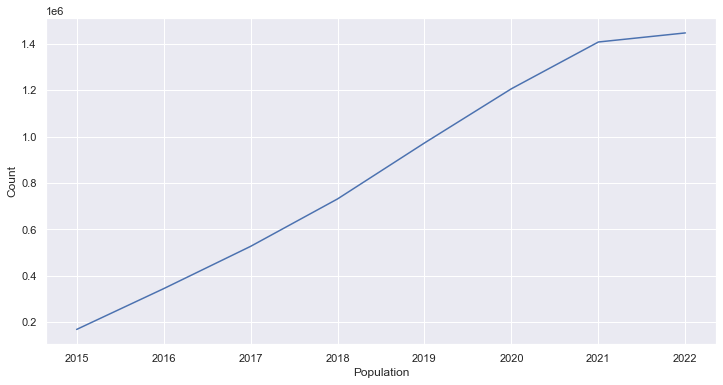

In [137]:
sns.set_theme()
plt.figure(figsize=(12, 6))
ax=sns.lineplot(data=Conteo_Union[Conteo_Union['FCC_year']!='NA'], x="FCC_year", y="Pop_Actual")
ax.set(xlabel='Population', ylabel='Count')

In [138]:
## Población la cual se qui
Conteo_Union['Pop_SinRetiros']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']
Conteo_Union

,FCC_year,Count_CCont,CumSum_CCont,FR_year,Count_Ret,CumSum_Ret,FS_year,Count_Sin,CumSum_Sin,Pop_Actual,Pop_SinRetiros
0,2015.0,170421,170421,2015.0,615,615,2015.0,114,114,169692,169806
1,2016.0,176530,346951,2016.0,1345,1960,2016.0,481,595,345125,345606
2,2017.0,182259,529210,2017.0,848,2808,2017.0,1115,1710,527247,528362
3,2018.0,205442,734652,2018.0,1895,4703,2018.0,1324,3034,731433,732757
4,2019.0,240588,975240,2019.0,1208,5911,2019.0,1660,4694,972372,974032
5,2020.0,234616,1209856,2020.0,977,6888,2020.0,3035,7729,1205844,1208879
6,2021.0,202158,1412014,2021.0,1120,8008,2021.0,3816,11545,1407078,1410894
7,2022.0,35573,1447587,2022.0,654,8662,2022.0,776,12321,1446157,1446933


In [139]:
# Calculo Tasa de Mortalidad de La entidad
Conteo_Union['Proporcion_Siniestros']=Conteo_Union['Count_Sin']/Conteo_Union['Pop_SinRetiros']
Conteo_Union

,FCC_year,Count_CCont,CumSum_CCont,FR_year,Count_Ret,CumSum_Ret,FS_year,Count_Sin,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros
0,2015.0,170421,170421,2015.0,615,615,2015.0,114,114,169692,169806,0.000671
1,2016.0,176530,346951,2016.0,1345,1960,2016.0,481,595,345125,345606,0.001392
2,2017.0,182259,529210,2017.0,848,2808,2017.0,1115,1710,527247,528362,0.002110
3,2018.0,205442,734652,2018.0,1895,4703,2018.0,1324,3034,731433,732757,0.001807
4,2019.0,240588,975240,2019.0,1208,5911,2019.0,1660,4694,972372,974032,0.001704
5,2020.0,234616,1209856,2020.0,977,6888,2020.0,3035,7729,1205844,1208879,0.002511
6,2021.0,202158,1412014,2021.0,1120,8008,2021.0,3816,11545,1407078,1410894,0.002705
7,2022.0,35573,1447587,2022.0,654,8662,2022.0,776,12321,1446157,1446933,0.000536


[Text(0.5, 0, 'Population'), Text(0, 0.5, 'Count')]

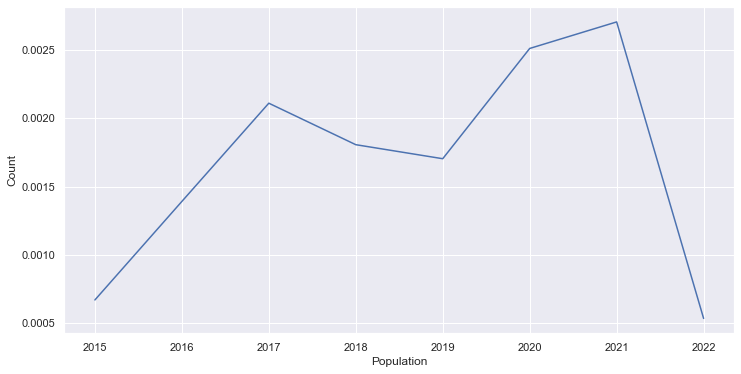

In [140]:
sns.set_theme()
plt.figure(figsize=(12, 6))
ax=sns.lineplot(data=Conteo_Union[Conteo_Union['FCC_year']!='NA'], x="FCC_year", y="Proporcion_Siniestros")
ax.set(xlabel='Population', ylabel='Count')

# Versión 2 mirando si quedaron años por fuera si hay atipicos 1900...

In [141]:
dte = dt.datetime(2015, 1, 1)
end = dt.datetime(2022, 3, 30)
step = relativedelta(months=+1)

result = []

while dte < end:
    result.append(dte.strftime('%Y-%m-%d'))
    dte += step

In [142]:
Fecha_Merge=pd.DataFrame(result,columns =['Fechas'])
Fecha_Merge

,Fechas
0,2015-01-01
1,2015-02-01
2,2015-03-01
3,2015-04-01
4,2015-05-01
...,...
82,2021-11-01
83,2021-12-01
84,2022-01-01
85,2022-02-01


In [143]:
Fecha_Merge['Fechas'] = pd.to_datetime(Fecha_Merge['Fechas'], format='%Y/%m/%d', errors = 'coerce')

In [144]:
Fecha_Merge['Year_Month']=Fecha_Merge['Fechas'].dt.strftime('%Y-%m')
Fecha_Merge['Year']=Fecha_Merge['Fechas'].dt.strftime('%Y').astype('float')
#Fecha_Merge['Month']=Fecha_Merge['Fechas'].dt.strftime('%m').astype('float')
Fecha_Merge

,Fechas,Year_Month,Year
0,2015-01-01,2015-01,2015.0
1,2015-02-01,2015-02,2015.0
2,2015-03-01,2015-03,2015.0
3,2015-04-01,2015-04,2015.0
4,2015-05-01,2015-05,2015.0
...,...,...,...
82,2021-11-01,2021-11,2021.0
83,2021-12-01,2021-12,2021.0
84,2022-01-01,2022-01,2022.0
85,2022-02-01,2022-02,2022.0


In [145]:
Year_Merge=Fecha_Merge['Year'].copy()
Year_Merge.drop_duplicates(inplace=True)

In [146]:
Year_Merge=pd.DataFrame(Year_Merge).reset_index()
Year_Merge.drop(columns='index',inplace=True)

In [147]:
Conteo_Union=Year_Merge.merge(Conteo_Benef,how='left',left_on='Year',right_on='FCC_year').merge(
    Count_Bef_Ret,how='left',left_on='Year',right_on='FR_year',suffixes=['_Ben','_Ret']).merge(
        Count_Bef_Sin,how='left',left_on='Year',right_on='FS_year',suffixes=['','_Sin'])
#.merge(Count_Bef_Sin,left_on='FCC_y_m',right_on='FS_y_m',suffixes=['','_Sin'])
Conteo_Union

,Year,FCC_year,Count_CCont,CumSum_CCont,FR_year,Count_Ret,CumSum_Ret,FS_year,Count_Sin,CumSum_Sin
0,2015.0,2015.0,170421,170421,2015.0,615,615,2015.0,114,114
1,2016.0,2016.0,176530,346951,2016.0,1345,1960,2016.0,481,595
2,2017.0,2017.0,182259,529210,2017.0,848,2808,2017.0,1115,1710
3,2018.0,2018.0,205442,734652,2018.0,1895,4703,2018.0,1324,3034
4,2019.0,2019.0,240588,975240,2019.0,1208,5911,2019.0,1660,4694
5,2020.0,2020.0,234616,1209856,2020.0,977,6888,2020.0,3035,7729
6,2021.0,2021.0,202158,1412014,2021.0,1120,8008,2021.0,3816,11545
7,2022.0,2022.0,35573,1447587,2022.0,654,8662,2022.0,776,12321


### Areglo de los cumsum

In [148]:
Conteo_Union['CumSum_CCont']=Conteo_Union['Count_CCont'].cumsum()
Conteo_Union['CumSum_Ret']=Conteo_Union['Count_Ret'].cumsum()
Conteo_Union['CumSum_Sin']=Conteo_Union['Count_Sin'].cumsum()
Conteo_Union

,Year,FCC_year,Count_CCont,CumSum_CCont,FR_year,Count_Ret,CumSum_Ret,FS_year,Count_Sin,CumSum_Sin
0,2015.0,2015.0,170421,170421,2015.0,615,615,2015.0,114,114
1,2016.0,2016.0,176530,346951,2016.0,1345,1960,2016.0,481,595
2,2017.0,2017.0,182259,529210,2017.0,848,2808,2017.0,1115,1710
3,2018.0,2018.0,205442,734652,2018.0,1895,4703,2018.0,1324,3034
4,2019.0,2019.0,240588,975240,2019.0,1208,5911,2019.0,1660,4694
5,2020.0,2020.0,234616,1209856,2020.0,977,6888,2020.0,3035,7729
6,2021.0,2021.0,202158,1412014,2021.0,1120,8008,2021.0,3816,11545
7,2022.0,2022.0,35573,1447587,2022.0,654,8662,2022.0,776,12321


In [149]:
Conteo_Union['Pop_Actual']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']-Conteo_Union['Count_Sin']
Conteo_Union['Pop_Sinretiros']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']
Conteo_Union['Proporcion_Siniestros']=Conteo_Union['Count_Sin']/Conteo_Union['Pop_Sinretiros']
Conteo_Union

,Year,FCC_year,Count_CCont,CumSum_CCont,FR_year,Count_Ret,CumSum_Ret,FS_year,Count_Sin,CumSum_Sin,Pop_Actual,Pop_Sinretiros,Proporcion_Siniestros
0,2015.0,2015.0,170421,170421,2015.0,615,615,2015.0,114,114,169692,169806,0.000671
1,2016.0,2016.0,176530,346951,2016.0,1345,1960,2016.0,481,595,345125,345606,0.001392
2,2017.0,2017.0,182259,529210,2017.0,848,2808,2017.0,1115,1710,527247,528362,0.002110
3,2018.0,2018.0,205442,734652,2018.0,1895,4703,2018.0,1324,3034,731433,732757,0.001807
4,2019.0,2019.0,240588,975240,2019.0,1208,5911,2019.0,1660,4694,972372,974032,0.001704
5,2020.0,2020.0,234616,1209856,2020.0,977,6888,2020.0,3035,7729,1205844,1208879,0.002511
6,2021.0,2021.0,202158,1412014,2021.0,1120,8008,2021.0,3816,11545,1407078,1410894,0.002705
7,2022.0,2022.0,35573,1447587,2022.0,654,8662,2022.0,776,12321,1446157,1446933,0.000536


In [150]:
# Plot de la creación de la fecha de creación del contrato
fig = px.line(Conteo_Union[Conteo_Union['Year']!='NA'], x='Year', y="Pop_Actual")
fig.show()

[Text(0.5, 0, 'Population'), Text(0, 0.5, 'Count')]

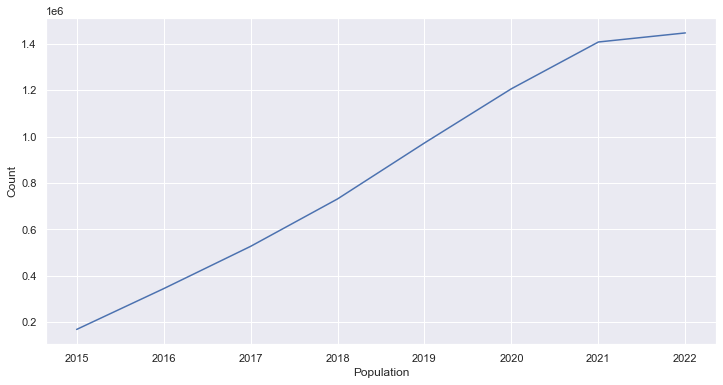

In [151]:
sns.set_theme()
plt.figure(figsize=(12, 6))
ax=sns.lineplot(data=Conteo_Union[Conteo_Union['Year']!='NA'], x="Year", y="Pop_Actual")
ax.set(xlabel='Population', ylabel='Count')

In [152]:
# Plot de la creación de la fecha de creación del contrato
fig = px.line(Conteo_Union[Conteo_Union['Year']!='NA'], x='Year', y="Proporcion_Siniestros")
fig.show()

[Text(0.5, 0, 'Population'), Text(0, 0.5, 'Count')]

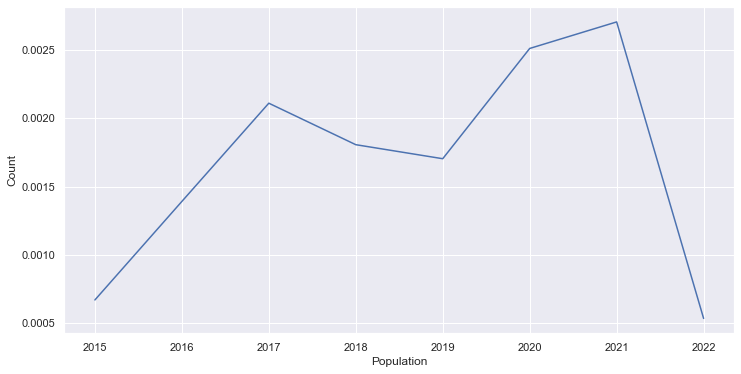

In [153]:
sns.set_theme()
plt.figure(figsize=(12, 6))
ax=sns.lineplot(data=Conteo_Union[Conteo_Union['Year']!='NA'], x="FCC_year", y="Proporcion_Siniestros")
ax.set(xlabel='Population', ylabel='Count')

##### Guardando Data Calculada

In [154]:
Conteo_Union.to_csv('Conteo_Anual_Pop.csv', index=False)

## Modificación por MES

### Conteo Fecha de Creación del Contrato

In [155]:
Conteo_Benef=df_benef[['FCC_y_m']].value_counts(sort=False).reset_index(name='Count_CCont')
Conteo_Benef['CumSum_CCont']=Conteo_Benef['Count_CCont'].cumsum()
Conteo_Benef

,FCC_y_m,Count_CCont,CumSum_CCont
0,2015-01,9972,9972
1,2015-02,11709,21681
2,2015-03,15664,37345
3,2015-04,12581,49926
4,2015-05,12720,62646
...,...,...,...
82,2021-11,11130,1401888
83,2021-12,10126,1412014
84,2022-01,18443,1430457
85,2022-02,11542,1441999


In [156]:
# Plot de la creación de la fecha de creación del contrato
fig = px.line(Conteo_Benef[Conteo_Benef['FCC_y_m']!='NA'], x='FCC_y_m', y="Count_CCont")
fig.show()

### Conteo Fecha de Retiro

In [157]:
Count_Bef_Ret=df_benef[['FR_y_m']].value_counts(sort=False).reset_index(name='Count_Ret')
Count_Bef_Ret['CumSum_Ret']=Count_Bef_Ret['Count_Ret'].cumsum()
Count_Bef_Ret

,FR_y_m,Count_Ret,CumSum_Ret
0,2015-01,1,1
1,2015-02,7,8
2,2015-03,27,35
3,2015-04,31,66
4,2015-05,35,101
...,...,...,...
82,2021-11,129,7906
83,2021-12,102,8008
84,2022-01,154,8162
85,2022-02,249,8411


In [158]:
fig = px.line(Count_Bef_Ret[Count_Bef_Ret['FR_y_m']!='NA'], x='FR_y_m', y="Count_Ret")
fig.show()

### Conteo Fecha de Siniestro

In [159]:
Count_Bef_Sin=df_benef[['FS_y_m']].value_counts(sort=False).reset_index(name='Count_Sin')
Count_Bef_Sin['CumSum_Sin']=Count_Bef_Sin['Count_Sin'].cumsum()
Count_Bef_Sin

,FS_y_m,Count_Sin,CumSum_Sin
0,2015-01,2,2
1,2015-03,3,5
2,2015-04,3,8
3,2015-05,2,10
4,2015-06,1,11
...,...,...,...
81,2021-11,217,11287
82,2021-12,258,11545
83,2022-01,360,11905
84,2022-02,239,12144


In [160]:
fig = px.line(Count_Bef_Sin[(Count_Bef_Sin['FS_y_m']!='NA')], x='FS_y_m', y="Count_Sin")
fig.show()

# Uniendo la Data

Creación de variable temporal para considerar periodos en los cuales no hubo Contratos, Retiros y Sinistros

In [161]:
from dateutil.relativedelta import *

In [162]:
dte = dt.datetime(2015, 1, 1)
end = dt.datetime(2022, 6, 30)
step = relativedelta(months=+1)

result = []

while dte < end:
    result.append(dte.strftime('%Y-%m-%d'))
    dte += step

In [163]:
Fecha_Merge=pd.DataFrame(result,columns =['Fechas'])
Fecha_Merge

,Fechas
0,2015-01-01
1,2015-02-01
2,2015-03-01
3,2015-04-01
4,2015-05-01
...,...
85,2022-02-01
86,2022-03-01
87,2022-04-01
88,2022-05-01


In [164]:
Fecha_Merge['Fechas'] = pd.to_datetime(Fecha_Merge['Fechas'], format='%Y/%m/%d', errors = 'coerce')

In [165]:
Fecha_Merge['Year_Month']=Fecha_Merge['Fechas'].dt.strftime('%Y-%m')
Fecha_Merge

,Fechas,Year_Month
0,2015-01-01,2015-01
1,2015-02-01,2015-02
2,2015-03-01,2015-03
3,2015-04-01,2015-04
4,2015-05-01,2015-05
...,...,...
85,2022-02-01,2022-02
86,2022-03-01,2022-03
87,2022-04-01,2022-04
88,2022-05-01,2022-05


In [166]:
new_row={'Fechas': np.nan, 'Year_Month':'NA'}
new_row

{'Fechas': nan, 'Year_Month': 'NA'}

In [167]:
Conteo_Union=Fecha_Merge.merge(Conteo_Benef,how='left',left_on='Year_Month',right_on='FCC_y_m',).merge(
    Count_Bef_Ret,how='left',left_on='Year_Month',right_on='FR_y_m',suffixes=['_Ben','_Ret']).merge(
        Count_Bef_Sin,how='left',left_on='Year_Month',right_on='FS_y_m',suffixes=['','_Sin'])
#.merge(Count_Bef_Sin,left_on='FCC_y_m',right_on='FS_y_m',suffixes=['','_Sin'])

In [168]:
Conteo_Union

,Fechas,Year_Month,FCC_y_m,Count_CCont,CumSum_CCont,FR_y_m,Count_Ret,CumSum_Ret,FS_y_m,Count_Sin,CumSum_Sin
0,2015-01-01,2015-01,2015-01,9972.0,9972.0,2015-01,1.0,1.0,2015-01,2.0,2.0
1,2015-02-01,2015-02,2015-02,11709.0,21681.0,2015-02,7.0,8.0,NaN,NaN,NaN
2,2015-03-01,2015-03,2015-03,15664.0,37345.0,2015-03,27.0,35.0,2015-03,3.0,5.0
3,2015-04-01,2015-04,2015-04,12581.0,49926.0,2015-04,31.0,66.0,2015-04,3.0,8.0
4,2015-05-01,2015-05,2015-05,12720.0,62646.0,2015-05,35.0,101.0,2015-05,2.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...
85,2022-02-01,2022-02,2022-02,11542.0,1441999.0,2022-02,249.0,8411.0,2022-02,239.0,12144.0
86,2022-03-01,2022-03,2022-03,5588.0,1447587.0,2022-03,251.0,8662.0,2022-03,177.0,12321.0
87,2022-04-01,2022-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,2022-05-01,2022-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Plot de Creación de Contratos

In [169]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')], x='Year_Month', y="Count_CCont")
fig.show()

#### Plot de Retiros

In [170]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')], x='Year_Month', y="Count_Ret")
fig.show()

#### Plot de Fallecimientos

In [171]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')], x='Year_Month', y="Count_Sin")
fig.show()

## Llenado de 0 en los Faltantes en Retiros y Siniestros

In [172]:
Conteo_Union['Count_Ret']=Conteo_Union['Count_Ret'].fillna(0)
Conteo_Union['Count_Sin']=Conteo_Union['Count_Sin'].fillna(0)

In [173]:
Conteo_Union['CumSum_CCont']=Conteo_Union[['Count_CCont']].cumsum()
Conteo_Union['CumSum_Ret']=Conteo_Union[['Count_Ret']].cumsum()
Conteo_Union['CumSum_Sin']=Conteo_Union[['Count_Sin']].cumsum()
Conteo_Union

,Fechas,Year_Month,FCC_y_m,Count_CCont,CumSum_CCont,FR_y_m,Count_Ret,CumSum_Ret,FS_y_m,Count_Sin,CumSum_Sin
0,2015-01-01,2015-01,2015-01,9972.0,9972.0,2015-01,1.0,1.0,2015-01,2.0,2.0
1,2015-02-01,2015-02,2015-02,11709.0,21681.0,2015-02,7.0,8.0,NaN,0.0,2.0
2,2015-03-01,2015-03,2015-03,15664.0,37345.0,2015-03,27.0,35.0,2015-03,3.0,5.0
3,2015-04-01,2015-04,2015-04,12581.0,49926.0,2015-04,31.0,66.0,2015-04,3.0,8.0
4,2015-05-01,2015-05,2015-05,12720.0,62646.0,2015-05,35.0,101.0,2015-05,2.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...
85,2022-02-01,2022-02,2022-02,11542.0,1441999.0,2022-02,249.0,8411.0,2022-02,239.0,12144.0
86,2022-03-01,2022-03,2022-03,5588.0,1447587.0,2022-03,251.0,8662.0,2022-03,177.0,12321.0
87,2022-04-01,2022-04,NaN,NaN,NaN,NaN,0.0,8662.0,NaN,0.0,12321.0
88,2022-05-01,2022-05,NaN,NaN,NaN,NaN,0.0,8662.0,NaN,0.0,12321.0


### Adicionando Variables al Modelo

In [174]:
# Población activa por mes quitando la población fallecida en dicho mes y la población retirada
Conteo_Union['Pop_Actual']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']-Conteo_Union['Count_Sin']
# Población Quitando solo los Retirados
Conteo_Union['Pop_SinRetiros']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']
# Con la anterior puedo calcular la proporción de Siniestros
Conteo_Union['Proporcion_Siniestros']=(Conteo_Union['Count_Sin']/Conteo_Union['Pop_SinRetiros'])
Conteo_Union

,Fechas,Year_Month,FCC_y_m,Count_CCont,CumSum_CCont,FR_y_m,Count_Ret,CumSum_Ret,FS_y_m,Count_Sin,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros
0,2015-01-01,2015-01,2015-01,9972.0,9972.0,2015-01,1.0,1.0,2015-01,2.0,2.0,9969.0,9971.0,0.000201
1,2015-02-01,2015-02,2015-02,11709.0,21681.0,2015-02,7.0,8.0,NaN,0.0,2.0,21674.0,21674.0,0.000000
2,2015-03-01,2015-03,2015-03,15664.0,37345.0,2015-03,27.0,35.0,2015-03,3.0,5.0,37315.0,37318.0,0.000080
3,2015-04-01,2015-04,2015-04,12581.0,49926.0,2015-04,31.0,66.0,2015-04,3.0,8.0,49892.0,49895.0,0.000060
4,2015-05-01,2015-05,2015-05,12720.0,62646.0,2015-05,35.0,101.0,2015-05,2.0,10.0,62609.0,62611.0,0.000032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,2022-02-01,2022-02,2022-02,11542.0,1441999.0,2022-02,249.0,8411.0,2022-02,239.0,12144.0,1441511.0,1441750.0,0.000166
86,2022-03-01,2022-03,2022-03,5588.0,1447587.0,2022-03,251.0,8662.0,2022-03,177.0,12321.0,1447159.0,1447336.0,0.000122
87,2022-04-01,2022-04,NaN,NaN,NaN,NaN,0.0,8662.0,NaN,0.0,12321.0,NaN,NaN,NaN
88,2022-05-01,2022-05,NaN,NaN,NaN,NaN,0.0,8662.0,NaN,0.0,12321.0,NaN,NaN,NaN


In [175]:
Conteo_Union['Fechas']=pd.to_datetime(Conteo_Union['Year_Month'], format='%Y-%m', errors = 'coerce')
Conteo_Union['Year']=Conteo_Union['Fechas'].dt.strftime('%Y').astype(int)
Conteo_Union['Month']=Conteo_Union['Fechas'].dt.strftime('%m').astype(int)
Conteo_Union.to_csv('Conteo_Year_Month.csv', index=False)

In [176]:
#TasaMortalidad_Ascension = Mes + Año + Pandemia + Departamento + Tasa Mortalidad Dane(Anual_Dep) + Mes:Año

##### Tasa de Siniestros 

In [177]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')&(Conteo_Union['Year_Month']>='2010-01')], x='Year_Month', y="Proporcion_Siniestros")
fig.show()

In [178]:
#Data_Modelado_Ascension['Sucursal'] = Data_Modelado_Ascension['Sucursal'].astype('category')

# Analisis por Ciudad

### Fecha de Creación del Contrato

In [179]:
Conteo_Benef=df_benef[['Sucursal','FCC_y_m']].groupby(['Sucursal','FCC_y_m'])['FCC_y_m'].count().reset_index(name='Count_CCont')#.value_counts(sort=False).reset_index(name='Count_CCont')
#Conteo_Benef['CumSum_CCont']=Conteo_Benef['Count_CCont'].cumsum()
Conteo_Benef

,Sucursal,FCC_y_m,Count_CCont
0,ANTIOQUIA,2015-01,321
1,ANTIOQUIA,2015-02,542
2,ANTIOQUIA,2015-03,841
3,ANTIOQUIA,2015-04,711
4,ANTIOQUIA,2015-05,1307
...,...,...,...
1906,VALLE DEL CAUCA,2021-11,731
1907,VALLE DEL CAUCA,2021-12,557
1908,VALLE DEL CAUCA,2022-01,556
1909,VALLE DEL CAUCA,2022-02,700


In [180]:
fig = px.line(Conteo_Benef[(Conteo_Benef['FCC_y_m']!='NA')&(Conteo_Benef['FCC_y_m']>='2015-01')], x='FCC_y_m', color='Sucursal', y="Count_CCont")
fig.show()

In [181]:
fig = px.line(Conteo_Benef[Conteo_Benef['FCC_y_m']!='NA'], x='FCC_y_m', color='Sucursal', y="Count_CCont")
fig.show()

### Conteo Fecha de Retiro

In [182]:
#Count_Bef_Ret=df_benef[['FR_y_m']].fillna('NA').value_counts(sort=False).reset_index(name='Count_Ret')
Count_Bef_Ret=df_benef[['Sucursal','FR_y_m']].groupby(['Sucursal','FR_y_m'])['FR_y_m'].count().reset_index(name='Count_Ret')
#Count_Bef_Ret['CumSum_Ret']=Count_Bef_Ret['Count_Ret'].cumsum()
Count_Bef_Ret

,Sucursal,FR_y_m,Count_Ret
0,ANTIOQUIA,2015-03,1
1,ANTIOQUIA,2015-05,1
2,ANTIOQUIA,2015-06,2
3,ANTIOQUIA,2015-07,13
4,ANTIOQUIA,2015-08,7
...,...,...,...
1442,VALLE DEL CAUCA,2021-11,12
1443,VALLE DEL CAUCA,2021-12,6
1444,VALLE DEL CAUCA,2022-01,10
1445,VALLE DEL CAUCA,2022-02,8


In [183]:
fig = px.line(Count_Bef_Ret[Count_Bef_Ret['FR_y_m']!='NA'], x='FR_y_m', y="Count_Ret",color='Sucursal')
fig.show()

### Conteo Fecha de Siniestro

In [184]:
#Count_Bef_Sin=df_benef[['FS_y_m']].fillna('NA').value_counts(sort=False).reset_index(name='Count_Sin')
Count_Bef_Sin=df_benef[['Sucursal','FS_y_m']].groupby(['Sucursal','FS_y_m'])['FS_y_m'].count().reset_index(name='Count_Sin')
#Count_Bef_Sin['CumSum_Sin']=Count_Bef_Sin['Count_Sin'].cumsum()
Count_Bef_Sin

,Sucursal,FS_y_m,Count_Sin
0,ANTIOQUIA,2015-05,1
1,ANTIOQUIA,2015-08,1
2,ANTIOQUIA,2015-09,1
3,ANTIOQUIA,2015-10,1
4,ANTIOQUIA,2015-11,1
...,...,...,...
1589,VALLE DEL CAUCA,2021-11,12
1590,VALLE DEL CAUCA,2021-12,17
1591,VALLE DEL CAUCA,2022-01,20
1592,VALLE DEL CAUCA,2022-02,7


In [185]:
fig = px.line(Count_Bef_Sin[(Count_Bef_Sin['FS_y_m']!='NA')], x='FS_y_m', y="Count_Sin",color='Sucursal')
fig.show()

# Uniendo la Data

Creación de variable temporal para considerar periodos en los cuales no hubo Contratos, Retiros y Sinistros

In [186]:
from dateutil.relativedelta import *

In [187]:

dte = dt.datetime(2015, 1, 1)
end = dt.datetime(2022, 6, 30)
step = relativedelta(months=+1)

result = []

while dte < end:
    result.append(dte.strftime('%Y-%m-%d'))
    dte += step

In [188]:
Fecha_Merge=pd.DataFrame(result,columns =['Fechas'])
Fecha_Merge

,Fechas
0,2015-01-01
1,2015-02-01
2,2015-03-01
3,2015-04-01
4,2015-05-01
...,...
85,2022-02-01
86,2022-03-01
87,2022-04-01
88,2022-05-01


In [189]:
Fecha_Merge['Fechas'] = pd.to_datetime(Fecha_Merge['Fechas'], format='%Y/%m/%d', errors = 'coerce')

In [190]:
list_sucursales=pd.DataFrame({'Sucursales':df_benef['Sucursal'].unique()})

In [191]:
from itertools import product

Fecha_Merge_Sucursal=pd.DataFrame(product(list_sucursales['Sucursales'], Fecha_Merge['Fechas']), columns=['Sucursal','Fechas'])
Fecha_Merge_Sucursal

,Sucursal,Fechas
0,TOLIMA,2015-01-01
1,TOLIMA,2015-02-01
2,TOLIMA,2015-03-01
3,TOLIMA,2015-04-01
4,TOLIMA,2015-05-01
...,...,...
2245,NO DISPNIBLE,2022-02-01
2246,NO DISPNIBLE,2022-03-01
2247,NO DISPNIBLE,2022-04-01
2248,NO DISPNIBLE,2022-05-01


In [192]:
Fecha_Merge_Sucursal['Year_Month']=Fecha_Merge_Sucursal['Fechas'].dt.strftime('%Y-%m')
Fecha_Merge_Sucursal

,Sucursal,Fechas,Year_Month
0,TOLIMA,2015-01-01,2015-01
1,TOLIMA,2015-02-01,2015-02
2,TOLIMA,2015-03-01,2015-03
3,TOLIMA,2015-04-01,2015-04
4,TOLIMA,2015-05-01,2015-05
...,...,...,...
2245,NO DISPNIBLE,2022-02-01,2022-02
2246,NO DISPNIBLE,2022-03-01,2022-03
2247,NO DISPNIBLE,2022-04-01,2022-04
2248,NO DISPNIBLE,2022-05-01,2022-05


In [193]:
new_row={'Sucursal':'NA','Fechas': np.nan, 'Year_Month':'NA'}
new_row

{'Sucursal': 'NA', 'Fechas': nan, 'Year_Month': 'NA'}

In [194]:
Conteo_Union=Fecha_Merge_Sucursal.merge(Conteo_Benef,how='left',left_on=['Sucursal','Year_Month'],right_on=['Sucursal','FCC_y_m']).merge(
    Count_Bef_Ret,how='left',left_on=['Sucursal','Year_Month'],right_on=['Sucursal','FR_y_m'],suffixes=['_Ben','_Ret']).merge(
        Count_Bef_Sin,how='left',left_on=['Sucursal','Year_Month'],right_on=['Sucursal','FS_y_m'],suffixes=['','_Sin'])
#.merge(Count_Bef_Sin,left_on='FCC_y_m',right_on='FS_y_m',suffixes=['','_Sin'])
Conteo_Union

,Sucursal,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin
0,TOLIMA,2015-01-01,2015-01,2015-01,829.0,2015-01,1.0,NaN,NaN
1,TOLIMA,2015-02-01,2015-02,2015-02,1118.0,NaN,NaN,NaN,NaN
2,TOLIMA,2015-03-01,2015-03,2015-03,1103.0,2015-03,4.0,NaN,NaN
3,TOLIMA,2015-04-01,2015-04,2015-04,940.0,2015-04,1.0,NaN,NaN
4,TOLIMA,2015-05-01,2015-05,2015-05,936.0,2015-05,3.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2245,NO DISPNIBLE,2022-02-01,2022-02,NaN,NaN,NaN,NaN,NaN,NaN
2246,NO DISPNIBLE,2022-03-01,2022-03,NaN,NaN,NaN,NaN,NaN,NaN
2247,NO DISPNIBLE,2022-04-01,2022-04,NaN,NaN,NaN,NaN,NaN,NaN
2248,NO DISPNIBLE,2022-05-01,2022-05,NaN,NaN,NaN,NaN,NaN,NaN


In [195]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')], x='Year_Month', y="Count_CCont",color='Sucursal')
fig.show()

In [196]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')], x='Year_Month', y="Count_CCont",color='Sucursal')
fig.show()

In [197]:
Conteo_Union['CumSum_CCont']=Conteo_Union[['Sucursal','Count_CCont']].groupby('Sucursal')['Count_CCont'].cumsum()
Conteo_Union['CumSum_Ret']=Conteo_Union[['Sucursal','Count_Ret']].groupby('Sucursal')['Count_Ret'].cumsum()
Conteo_Union['CumSum_Sin']=Conteo_Union[['Sucursal','Count_Sin']].groupby('Sucursal')['Count_Sin'].cumsum()
Conteo_Union

,Sucursal,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin
0,TOLIMA,2015-01-01,2015-01,2015-01,829.0,2015-01,1.0,NaN,NaN,829.0,1.0,NaN
1,TOLIMA,2015-02-01,2015-02,2015-02,1118.0,NaN,NaN,NaN,NaN,1947.0,NaN,NaN
2,TOLIMA,2015-03-01,2015-03,2015-03,1103.0,2015-03,4.0,NaN,NaN,3050.0,5.0,NaN
3,TOLIMA,2015-04-01,2015-04,2015-04,940.0,2015-04,1.0,NaN,NaN,3990.0,6.0,NaN
4,TOLIMA,2015-05-01,2015-05,2015-05,936.0,2015-05,3.0,NaN,NaN,4926.0,9.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2245,NO DISPNIBLE,2022-02-01,2022-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2246,NO DISPNIBLE,2022-03-01,2022-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2247,NO DISPNIBLE,2022-04-01,2022-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2248,NO DISPNIBLE,2022-05-01,2022-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [198]:
Conteo_Union['Count_CCont']=Conteo_Union['Count_CCont'].fillna(0)
Conteo_Union['Count_Ret']=Conteo_Union['Count_Ret'].fillna(0)
Conteo_Union['Count_Sin']=Conteo_Union['Count_Sin'].fillna(0)

In [199]:
Conteo_Union['CumSum_CCont']=Conteo_Union[['Sucursal','Count_CCont']].groupby('Sucursal')['Count_CCont'].cumsum()
Conteo_Union['CumSum_Ret']=Conteo_Union[['Sucursal','Count_Ret']].groupby('Sucursal')['Count_Ret'].cumsum()
Conteo_Union['CumSum_Sin']=Conteo_Union[['Sucursal','Count_Sin']].groupby('Sucursal')['Count_Sin'].cumsum()
Conteo_Union

,Sucursal,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin
0,TOLIMA,2015-01-01,2015-01,2015-01,829.0,2015-01,1.0,NaN,0.0,829.0,1.0,0.0
1,TOLIMA,2015-02-01,2015-02,2015-02,1118.0,NaN,0.0,NaN,0.0,1947.0,1.0,0.0
2,TOLIMA,2015-03-01,2015-03,2015-03,1103.0,2015-03,4.0,NaN,0.0,3050.0,5.0,0.0
3,TOLIMA,2015-04-01,2015-04,2015-04,940.0,2015-04,1.0,NaN,0.0,3990.0,6.0,0.0
4,TOLIMA,2015-05-01,2015-05,2015-05,936.0,2015-05,3.0,NaN,0.0,4926.0,9.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2245,NO DISPNIBLE,2022-02-01,2022-02,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0
2246,NO DISPNIBLE,2022-03-01,2022-03,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0
2247,NO DISPNIBLE,2022-04-01,2022-04,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0
2248,NO DISPNIBLE,2022-05-01,2022-05,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0


### Adicionando Variables al Modelo

In [200]:
# Población activa por mes quitando la población fallecida en dicho mes y la población retirada
Conteo_Union['Pop_Actual']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']-Conteo_Union['Count_Sin']
# Población Quitando solo los Retirados
Conteo_Union['Pop_SinRetiros']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']
# Con la anterior puedo calcular la proporción de Siniestros
Conteo_Union['Proporcion_Siniestros']=(Conteo_Union['Count_Sin']/Conteo_Union['Pop_SinRetiros'])
Conteo_Union

,Sucursal,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros
0,TOLIMA,2015-01-01,2015-01,2015-01,829.0,2015-01,1.0,NaN,0.0,829.0,1.0,0.0,828.0,828.0,0.0
1,TOLIMA,2015-02-01,2015-02,2015-02,1118.0,NaN,0.0,NaN,0.0,1947.0,1.0,0.0,1947.0,1947.0,0.0
2,TOLIMA,2015-03-01,2015-03,2015-03,1103.0,2015-03,4.0,NaN,0.0,3050.0,5.0,0.0,3046.0,3046.0,0.0
3,TOLIMA,2015-04-01,2015-04,2015-04,940.0,2015-04,1.0,NaN,0.0,3990.0,6.0,0.0,3989.0,3989.0,0.0
4,TOLIMA,2015-05-01,2015-05,2015-05,936.0,2015-05,3.0,NaN,0.0,4926.0,9.0,0.0,4923.0,4923.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2245,NO DISPNIBLE,2022-02-01,2022-02,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0
2246,NO DISPNIBLE,2022-03-01,2022-03,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0
2247,NO DISPNIBLE,2022-04-01,2022-04,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0
2248,NO DISPNIBLE,2022-05-01,2022-05,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0


In [201]:
fig = px.line(Conteo_Union, x='Year_Month', y="Pop_SinRetiros",color='Sucursal')
fig.show()

Tiene 0 y toca corregir este problema

In [202]:
fig = px.line(Conteo_Union, x='Year_Month', y="Proporcion_Siniestros",color='Sucursal')
fig.show()

In [203]:
Conteo_Union.loc[(Conteo_Union['Proporcion_Siniestros']<0),'Proporcion_Siniestros'] = 0

In [205]:
Conteo_Union['Fechas']=pd.to_datetime(Conteo_Union['Year_Month'], format='%Y-%m', errors = 'coerce')
Conteo_Union['Year']=Conteo_Union['Fechas'].dt.strftime('%Y').astype(int)
Conteo_Union['Month']=Conteo_Union['Fechas'].dt.strftime('%m').astype(int)
Conteo_Union.to_csv('Conteo_Anual_Mens_Pop_Ubic.csv', index=False)

In [206]:
Conteo_Union[Conteo_Union['Proporcion_Siniestros']<0]

,Sucursal,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros,Year,Month


In [207]:
Conteo_Union2=Conteo_Union[Conteo_Union['Year_Month']!='NA'].copy()
Conteo_Union2

,Sucursal,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros,Year,Month
0,TOLIMA,2015-01-01,2015-01,2015-01,829.0,2015-01,1.0,NaN,0.0,829.0,1.0,0.0,828.0,828.0,0.0,2015,1
1,TOLIMA,2015-02-01,2015-02,2015-02,1118.0,NaN,0.0,NaN,0.0,1947.0,1.0,0.0,1947.0,1947.0,0.0,2015,2
2,TOLIMA,2015-03-01,2015-03,2015-03,1103.0,2015-03,4.0,NaN,0.0,3050.0,5.0,0.0,3046.0,3046.0,0.0,2015,3
3,TOLIMA,2015-04-01,2015-04,2015-04,940.0,2015-04,1.0,NaN,0.0,3990.0,6.0,0.0,3989.0,3989.0,0.0,2015,4
4,TOLIMA,2015-05-01,2015-05,2015-05,936.0,2015-05,3.0,NaN,0.0,4926.0,9.0,0.0,4923.0,4923.0,0.0,2015,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2245,NO DISPNIBLE,2022-02-01,2022-02,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0,2022,2
2246,NO DISPNIBLE,2022-03-01,2022-03,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0,2022,3
2247,NO DISPNIBLE,2022-04-01,2022-04,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0,2022,4
2248,NO DISPNIBLE,2022-05-01,2022-05,NaN,0.0,NaN,0.0,NaN,0.0,150.0,0.0,2.0,150.0,150.0,0.0,2022,5


In [208]:
#Conteo_Union2['Fechas']=
Conteo_Union2['Fechas']=pd.to_datetime(Conteo_Union2['Year_Month'], format='%Y-%m', errors = 'coerce')
Conteo_Union2['Year']=Conteo_Union2['Fechas'].dt.strftime('%Y').astype(int)

In [209]:
fig = px.line(Conteo_Union2[(Conteo_Union2['Year_Month']!='NA')&(Conteo_Union2['Year']>=2015)], x='Year_Month', y="Pop_Actual",color='Sucursal')
fig.show()

In [210]:
fig = px.line(Conteo_Union2[(Conteo_Union2['Year_Month']!='NA')&(Conteo_Union2['Year']>=2015)], x='Year_Month', y="Proporcion_Siniestros",color='Sucursal')
fig.show()

In [211]:
fig = px.line(Conteo_Union2[(Conteo_Union2['Year_Month']!='NA')], x='Year_Month', y="Proporcion_Siniestros",color='Sucursal')
fig.show()

# Generando Data Agrupado por MES, AÑO, SUCURSAL, GRUPOS EDAD

### Fecha de Creación del Contrato

In [212]:
Conteo_Benef=df_benef[['Sucursal','Rango_Edad','FCC_y_m']].groupby(['Sucursal','Rango_Edad','FCC_y_m'])['FCC_y_m'].count().reset_index(name='Count_CCont')#.value_counts(sort=False).reset_index(name='Count_CCont')
#Conteo_Benef['CumSum_CCont']=Conteo_Benef['Count_CCont'].cumsum()
Conteo_Benef

,Sucursal,Rango_Edad,FCC_y_m,Count_CCont
0,ANTIOQUIA,1-4,2015-01,1
1,ANTIOQUIA,1-4,2015-02,1
2,ANTIOQUIA,1-4,2015-04,1
3,ANTIOQUIA,1-4,2015-05,4
4,ANTIOQUIA,1-4,2015-06,1
...,...,...,...,...
10387,VALLE DEL CAUCA,mas_100,2015-03,3
10388,VALLE DEL CAUCA,mas_100,2015-04,4
10389,VALLE DEL CAUCA,mas_100,2015-07,2
10390,VALLE DEL CAUCA,mas_100,2017-01,1


In [213]:
fig = px.line(Conteo_Benef[(Conteo_Benef['FCC_y_m']!='NA')&(Conteo_Benef['FCC_y_m']>='2015-01')], x='FCC_y_m', color='Sucursal', y="Count_CCont", hover_name='Rango_Edad')
fig.show()

In [214]:
fig = px.line(Conteo_Benef[Conteo_Benef['FCC_y_m']!='NA'], x='FCC_y_m', color='Sucursal', y="Count_CCont", hover_name='Rango_Edad')
fig.show()

### Conteo Fecha de Retiro

In [215]:
#Count_Bef_Ret=df_benef[['FR_y_m']].fillna('NA').value_counts(sort=False).reset_index(name='Count_Ret')
Count_Bef_Ret=df_benef[['Sucursal','Rango_Edad','FR_y_m']].groupby(['Sucursal','Rango_Edad','FR_y_m'])['FR_y_m'].count().reset_index(name='Count_Ret')
#Count_Bef_Ret['CumSum_Ret']=Count_Bef_Ret['Count_Ret'].cumsum()
Count_Bef_Ret

,Sucursal,Rango_Edad,FR_y_m,Count_Ret
0,ANTIOQUIA,1-4,2018-08,5
1,ANTIOQUIA,1-4,2019-12,1
2,ANTIOQUIA,15-44,2015-07,4
3,ANTIOQUIA,15-44,2016-01,1
4,ANTIOQUIA,15-44,2016-02,1
...,...,...,...,...
3365,VALLE DEL CAUCA,85-99,2018-02,2
3366,VALLE DEL CAUCA,85-99,2020-01,1
3367,VALLE DEL CAUCA,85-99,2021-02,1
3368,VALLE DEL CAUCA,85-99,2021-03,1


In [216]:
fig = px.line(Count_Bef_Ret[Count_Bef_Ret['FR_y_m']!='NA'], x='FR_y_m', y="Count_Ret")
fig.show()

### Conteo Fecha de Siniestro

In [217]:
#Count_Bef_Sin=df_benef[['FS_y_m']].fillna('NA').value_counts(sort=False).reset_index(name='Count_Sin')
Count_Bef_Sin=df_benef[['Sucursal','Rango_Edad','FS_y_m']].groupby(['Sucursal','Rango_Edad','FS_y_m'])['FS_y_m'].count().reset_index(name='Count_Sin')
#Count_Bef_Sin['CumSum_Sin']=Count_Bef_Sin['Count_Sin'].cumsum()
Count_Bef_Sin

,Sucursal,Rango_Edad,FS_y_m,Count_Sin
0,ANTIOQUIA,1-4,2021-01,1
1,ANTIOQUIA,15-44,2016-02,1
2,ANTIOQUIA,15-44,2016-07,1
3,ANTIOQUIA,15-44,2016-10,1
4,ANTIOQUIA,15-44,2017-09,1
...,...,...,...,...
4051,VALLE DEL CAUCA,85-99,2021-11,1
4052,VALLE DEL CAUCA,85-99,2022-01,3
4053,VALLE DEL CAUCA,mas_100,2016-11,2
4054,VALLE DEL CAUCA,mas_100,2018-08,1


In [218]:
fig = px.line(Count_Bef_Sin[(Count_Bef_Sin['FS_y_m']!='NA')], x='FS_y_m', y="Count_Sin",color='Sucursal')
fig.show()

# Uniendo la Data

Creación de variable temporal para considerar periodos en los cuales no hubo Contratos, Retiros y Sinistros

In [219]:
from dateutil.relativedelta import *

In [220]:

dte = dt.datetime(2015, 1, 1)
end = dt.datetime(2022, 6, 30)
step = relativedelta(months=+1)

result = []

while dte < end:
    result.append(dte.strftime('%Y-%m-%d'))
    dte += step

In [221]:
Fecha_Merge=pd.DataFrame(result,columns =['Fechas'])
Fecha_Merge

,Fechas
0,2015-01-01
1,2015-02-01
2,2015-03-01
3,2015-04-01
4,2015-05-01
...,...
85,2022-02-01
86,2022-03-01
87,2022-04-01
88,2022-05-01


In [222]:
Fecha_Merge['Fechas'] = pd.to_datetime(Fecha_Merge['Fechas'], format='%Y/%m/%d', errors = 'coerce')

In [223]:
list_sucursales=pd.DataFrame({'Sucursales':df_benef['Sucursal'].unique()})

In [224]:
list_Rang_Edad=pd.DataFrame({'Rango_Edad':df_benef['Rango_Edad'].unique()})

In [225]:
from itertools import product

Fecha_Merge_Sucursal=pd.DataFrame(product(list_sucursales['Sucursales'],list_Rang_Edad['Rango_Edad'], Fecha_Merge['Fechas']), columns=['Sucursal','Rango_Edad','Fechas'])
Fecha_Merge_Sucursal

,Sucursal,Rango_Edad,Fechas
0,TOLIMA,15-44,2015-01-01
1,TOLIMA,15-44,2015-02-01
2,TOLIMA,15-44,2015-03-01
3,TOLIMA,15-44,2015-04-01
4,TOLIMA,15-44,2015-05-01
...,...,...,...
20245,NO DISPNIBLE,NA,2022-02-01
20246,NO DISPNIBLE,NA,2022-03-01
20247,NO DISPNIBLE,NA,2022-04-01
20248,NO DISPNIBLE,NA,2022-05-01


In [226]:
Fecha_Merge_Sucursal['Year_Month']=Fecha_Merge_Sucursal['Fechas'].dt.strftime('%Y-%m')
Fecha_Merge_Sucursal

,Sucursal,Rango_Edad,Fechas,Year_Month
0,TOLIMA,15-44,2015-01-01,2015-01
1,TOLIMA,15-44,2015-02-01,2015-02
2,TOLIMA,15-44,2015-03-01,2015-03
3,TOLIMA,15-44,2015-04-01,2015-04
4,TOLIMA,15-44,2015-05-01,2015-05
...,...,...,...,...
20245,NO DISPNIBLE,NA,2022-02-01,2022-02
20246,NO DISPNIBLE,NA,2022-03-01,2022-03
20247,NO DISPNIBLE,NA,2022-04-01,2022-04
20248,NO DISPNIBLE,NA,2022-05-01,2022-05


In [227]:
Conteo_Union=Fecha_Merge_Sucursal.merge(Conteo_Benef,how='left',left_on=['Sucursal','Rango_Edad','Year_Month'],right_on=['Sucursal','Rango_Edad','FCC_y_m']).merge(
    Count_Bef_Ret,how='left',left_on=['Sucursal','Rango_Edad','Year_Month'],right_on=['Sucursal','Rango_Edad','FR_y_m'],suffixes=['_Ben','_Ret']).merge(
        Count_Bef_Sin,how='left',left_on=['Sucursal','Rango_Edad','Year_Month'],right_on=['Sucursal','Rango_Edad','FS_y_m'],suffixes=['','_Sin'])
#.merge(Count_Bef_Sin,left_on='FCC_y_m',right_on='FS_y_m',suffixes=['','_Sin'])
Conteo_Union

,Sucursal,Rango_Edad,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin
0,TOLIMA,15-44,2015-01-01,2015-01,2015-01,361.0,NaN,NaN,NaN,NaN
1,TOLIMA,15-44,2015-02-01,2015-02,2015-02,528.0,NaN,NaN,NaN,NaN
2,TOLIMA,15-44,2015-03-01,2015-03,2015-03,499.0,2015-03,1.0,NaN,NaN
3,TOLIMA,15-44,2015-04-01,2015-04,2015-04,429.0,2015-04,1.0,NaN,NaN
4,TOLIMA,15-44,2015-05-01,2015-05,2015-05,436.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
20245,NO DISPNIBLE,NA,2022-02-01,2022-02,NaN,NaN,NaN,NaN,NaN,NaN
20246,NO DISPNIBLE,NA,2022-03-01,2022-03,NaN,NaN,NaN,NaN,NaN,NaN
20247,NO DISPNIBLE,NA,2022-04-01,2022-04,NaN,NaN,NaN,NaN,NaN,NaN
20248,NO DISPNIBLE,NA,2022-05-01,2022-05,NaN,NaN,NaN,NaN,NaN,NaN


In [228]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')], x='Year_Month', y="Count_CCont")
fig.show()

In [229]:
fig = px.line(Conteo_Union[(Conteo_Union['Year_Month']!='NA')], x='Year_Month', y="Count_CCont",color='Sucursal')
fig.show()

In [230]:
Conteo_Union['CumSum_CCont']=Conteo_Union[['Sucursal','Rango_Edad','Count_CCont']].groupby(['Sucursal','Rango_Edad'])['Count_CCont'].cumsum()
Conteo_Union['CumSum_Ret']=Conteo_Union[['Sucursal','Rango_Edad','Count_Ret']].groupby(['Sucursal','Rango_Edad'])['Count_Ret'].cumsum()
Conteo_Union['CumSum_Sin']=Conteo_Union[['Sucursal','Rango_Edad','Count_Sin']].groupby(['Sucursal','Rango_Edad'])['Count_Sin'].cumsum()
Conteo_Union

,Sucursal,Rango_Edad,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin
0,TOLIMA,15-44,2015-01-01,2015-01,2015-01,361.0,NaN,NaN,NaN,NaN,361.0,NaN,NaN
1,TOLIMA,15-44,2015-02-01,2015-02,2015-02,528.0,NaN,NaN,NaN,NaN,889.0,NaN,NaN
2,TOLIMA,15-44,2015-03-01,2015-03,2015-03,499.0,2015-03,1.0,NaN,NaN,1388.0,1.0,NaN
3,TOLIMA,15-44,2015-04-01,2015-04,2015-04,429.0,2015-04,1.0,NaN,NaN,1817.0,2.0,NaN
4,TOLIMA,15-44,2015-05-01,2015-05,2015-05,436.0,NaN,NaN,NaN,NaN,2253.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20245,NO DISPNIBLE,NA,2022-02-01,2022-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20246,NO DISPNIBLE,NA,2022-03-01,2022-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20247,NO DISPNIBLE,NA,2022-04-01,2022-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20248,NO DISPNIBLE,NA,2022-05-01,2022-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [231]:
Conteo_Union['Count_CCont']=Conteo_Union['Count_CCont'].fillna(0)
Conteo_Union['Count_Ret']=Conteo_Union['Count_Ret'].fillna(0)
Conteo_Union['Count_Sin']=Conteo_Union['Count_Sin'].fillna(0)

In [232]:
Conteo_Union['CumSum_CCont']=Conteo_Union[['Sucursal','Rango_Edad','Count_CCont']].groupby(['Sucursal','Rango_Edad'])['Count_CCont'].cumsum()
Conteo_Union['CumSum_Ret']=Conteo_Union[['Sucursal','Rango_Edad','Count_Ret']].groupby(['Sucursal','Rango_Edad'])['Count_Ret'].cumsum()
Conteo_Union['CumSum_Sin']=Conteo_Union[['Sucursal','Rango_Edad','Count_Sin']].groupby(['Sucursal','Rango_Edad'])['Count_Sin'].cumsum()
Conteo_Union

,Sucursal,Rango_Edad,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin
0,TOLIMA,15-44,2015-01-01,2015-01,2015-01,361.0,NaN,0.0,NaN,0.0,361.0,0.0,0.0
1,TOLIMA,15-44,2015-02-01,2015-02,2015-02,528.0,NaN,0.0,NaN,0.0,889.0,0.0,0.0
2,TOLIMA,15-44,2015-03-01,2015-03,2015-03,499.0,2015-03,1.0,NaN,0.0,1388.0,1.0,0.0
3,TOLIMA,15-44,2015-04-01,2015-04,2015-04,429.0,2015-04,1.0,NaN,0.0,1817.0,2.0,0.0
4,TOLIMA,15-44,2015-05-01,2015-05,2015-05,436.0,NaN,0.0,NaN,0.0,2253.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20245,NO DISPNIBLE,NA,2022-02-01,2022-02,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0
20246,NO DISPNIBLE,NA,2022-03-01,2022-03,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0
20247,NO DISPNIBLE,NA,2022-04-01,2022-04,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0
20248,NO DISPNIBLE,NA,2022-05-01,2022-05,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0


### Adicionando Variables al Modelo

In [233]:
# Población activa por mes quitando la población fallecida en dicho mes y la población retirada
Conteo_Union['Pop_Actual']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']-Conteo_Union['Count_Sin']
# Población Quitando solo los Retirados
Conteo_Union['Pop_SinRetiros']=Conteo_Union['CumSum_CCont']-Conteo_Union['Count_Ret']
# Con la anterior puedo calcular la proporción de Siniestros
Conteo_Union['Proporcion_Siniestros']=(Conteo_Union['Count_Sin']/Conteo_Union['Pop_SinRetiros'])
Conteo_Union

,Sucursal,Rango_Edad,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros
0,TOLIMA,15-44,2015-01-01,2015-01,2015-01,361.0,NaN,0.0,NaN,0.0,361.0,0.0,0.0,361.0,361.0,0.0
1,TOLIMA,15-44,2015-02-01,2015-02,2015-02,528.0,NaN,0.0,NaN,0.0,889.0,0.0,0.0,889.0,889.0,0.0
2,TOLIMA,15-44,2015-03-01,2015-03,2015-03,499.0,2015-03,1.0,NaN,0.0,1388.0,1.0,0.0,1387.0,1387.0,0.0
3,TOLIMA,15-44,2015-04-01,2015-04,2015-04,429.0,2015-04,1.0,NaN,0.0,1817.0,2.0,0.0,1816.0,1816.0,0.0
4,TOLIMA,15-44,2015-05-01,2015-05,2015-05,436.0,NaN,0.0,NaN,0.0,2253.0,2.0,0.0,2253.0,2253.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20245,NO DISPNIBLE,NA,2022-02-01,2022-02,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN
20246,NO DISPNIBLE,NA,2022-03-01,2022-03,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN
20247,NO DISPNIBLE,NA,2022-04-01,2022-04,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN
20248,NO DISPNIBLE,NA,2022-05-01,2022-05,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN


In [234]:
fig = px.line(Conteo_Union, x='Year_Month', y="Pop_SinRetiros",color='Sucursal', hover_name='Rango_Edad', line_group="Rango_Edad")
fig.show()

In [235]:
fig = px.line(Conteo_Union, x='Year_Month', y="Proporcion_Siniestros",color='Sucursal', hover_name='Rango_Edad', line_group="Rango_Edad")
fig.show()

In [236]:
Conteo_Union.loc[(Conteo_Union['Proporcion_Siniestros']<0),'Proporcion_Siniestros'] = 0

In [237]:
Conteo_Union['Fechas']=pd.to_datetime(Conteo_Union['Year_Month'], format='%Y-%m', errors = 'coerce')
Conteo_Union['Year']=Conteo_Union['Fechas'].dt.strftime('%Y').astype(int)
Conteo_Union['Month']=Conteo_Union['Fechas'].dt.strftime('%m').astype(int)
Conteo_Union.to_csv('Conteo_Anual_Mens_Ubic_EdadPop.csv', index=False)

In [238]:
Conteo_Union[Conteo_Union['Proporcion_Siniestros']<0]

,Sucursal,Rango_Edad,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros,Year,Month


In [239]:
Conteo_Union2=Conteo_Union[Conteo_Union['Year_Month']!='NA'].copy()
Conteo_Union2

,Sucursal,Rango_Edad,Fechas,Year_Month,FCC_y_m,Count_CCont,FR_y_m,Count_Ret,FS_y_m,Count_Sin,CumSum_CCont,CumSum_Ret,CumSum_Sin,Pop_Actual,Pop_SinRetiros,Proporcion_Siniestros,Year,Month
0,TOLIMA,15-44,2015-01-01,2015-01,2015-01,361.0,NaN,0.0,NaN,0.0,361.0,0.0,0.0,361.0,361.0,0.0,2015,1
1,TOLIMA,15-44,2015-02-01,2015-02,2015-02,528.0,NaN,0.0,NaN,0.0,889.0,0.0,0.0,889.0,889.0,0.0,2015,2
2,TOLIMA,15-44,2015-03-01,2015-03,2015-03,499.0,2015-03,1.0,NaN,0.0,1388.0,1.0,0.0,1387.0,1387.0,0.0,2015,3
3,TOLIMA,15-44,2015-04-01,2015-04,2015-04,429.0,2015-04,1.0,NaN,0.0,1817.0,2.0,0.0,1816.0,1816.0,0.0,2015,4
4,TOLIMA,15-44,2015-05-01,2015-05,2015-05,436.0,NaN,0.0,NaN,0.0,2253.0,2.0,0.0,2253.0,2253.0,0.0,2015,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20245,NO DISPNIBLE,NA,2022-02-01,2022-02,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2022,2
20246,NO DISPNIBLE,NA,2022-03-01,2022-03,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2022,3
20247,NO DISPNIBLE,NA,2022-04-01,2022-04,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2022,4
20248,NO DISPNIBLE,NA,2022-05-01,2022-05,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2022,5


In [240]:
#Conteo_Union2['Fechas']=
Conteo_Union2['Fechas']=pd.to_datetime(Conteo_Union2['Year_Month'], format='%Y-%m', errors = 'coerce')
Conteo_Union2['Year']=Conteo_Union2['Fechas'].dt.strftime('%Y').astype(int)

In [241]:
fig = px.line(Conteo_Union2[(Conteo_Union2['Year_Month']!='NA')&(Conteo_Union2['Year']>=2015)], x='Year_Month', y="Pop_Actual",color='Sucursal', hover_name='Rango_Edad', line_group="Rango_Edad")
fig.show()

In [242]:
fig = px.line(Conteo_Union2[(Conteo_Union2['Year_Month']!='NA')&(Conteo_Union2['Year']>=2015)], x='Year_Month', y="Proporcion_Siniestros",color='Sucursal', hover_name='Rango_Edad', line_group="Rango_Edad")
fig.show()

In [243]:
fig = px.line(Conteo_Union2[(Conteo_Union2['Year_Month']!='NA')], x='Year_Month', y="Proporcion_Siniestros",color='Sucursal', hover_name='Rango_Edad', line_group="Rango_Edad")
fig.show()